In [1]:
#fixes Latex rendering
import plotly 
from IPython.display import display, HTML
plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https:{}//cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

In [2]:
import stellgap

In [3]:
import os
import numpy as np
import plotly.graph_objects as go
import warnings

from dataclasses import dataclass, field
from typing import List, Tuple
import f90nml
import scipy.sparse as sp

from simsopt.mhd import Vmec

@dataclass
class FourierDat:
    """
    Represents the mode structure for a STELLGAP run as specified in a fourier.dat file.

    Attributes:
        Nfp (int): Number of field periods. For tokamaks, typically 1.
        ith (int): Number of zeta grid points, maximum mpol is calculated as ith * 2 / 5.
        izt (int): Number of theta grid points, maximum ntor is calculated as izt * 2 / 5.
        mode_family (int): Identifier for the mode family, not currently used in calculations.
        mode_definitions (List[Tuple[int, int, int]]): List of mode definitions with (nw, mwl, mwu).
        original_content (str): The original text content of the fourier.dat file.

    Example File Content:
        fourier.dat
        ```
        1  80  80  4
        1
        2  0 12
        ```

        Explanation:
        - Nfp = 1: Single field period typical of a tokamak.
        - ith = 80: Grid has 80 points; maximum mpol = 32 (ith * 2 / 5).
        - izt = 80: Grid has 80 points; maximum ntor = 32 (izt * 2 / 5).
        - mode_family = 4: Currently not used in calculations.
        - nt_col = 1: Number of mode definitions that follow.
        - Mode definition for n=2: Toroidal mode number is 2; poloidal mode numbers range from 0 to 12.
    """
    Nfp: int
    ith: int
    izt: int
    mode_family: int
    mode_definitions: List[Tuple[int, int, int]] = field(default_factory=list)
    original_content: str = ""

    def __post_init__(self):
        self.mpol_max = self.ith * 2 // 5
        self.ntor_max = self.izt * 2 // 5

    @classmethod
    def from_file(cls, filename):
        with open(filename, 'r') as file:
            lines = file.readlines()
        original_content = "".join(lines)

        header = lines[0].split()
        Nfp = int(header[0])
        ith = int(header[1])
        izt = int(header[2])
        mode_family = int(header[3])
        nt_col = int(lines[1].strip())

        mode_definitions = []
        for i in range(2, 2 + nt_col):
            parts = lines[i].split()
            nw = int(parts[0])
            mwl = int(parts[1])
            mwu = int(parts[2])
            mode_definitions.append((nw, mwl, mwu))

        return cls(Nfp, ith, izt, mode_family, mode_definitions, original_content)

    def __str__(self):
        return self.explain()

    def explain(self):
        return f"""***Original Content***
{self.original_content}

Explanation:
Nfp = {self.Nfp} - single field period as in a tokamak
ith = {self.ith} - zero grid has {self.ith} points, therefore maximum mpol that can be resolved is {self.mpol_max}
izt = {self.izt} - theta grid has {self.izt} points, therefore maximum ntor that can be resolved is {self.ntor_max}
nt_col = {len(self.mode_definitions)} - number of mode definitions; determines how many lines of fourer.dat  to read
mode_family = {self.mode_family} - this number is currently not used in calculation, but read by code
Mode Definitions: {self.mode_definitions}
        """
    
@dataclass
class PlasmaDat:
    """
    Represents the plasma configuration for a STELLGAP run as specified in a plasma.dat file.
    
    Attributes:
        ion_to_proton_mass (float): Mass ratio of ion to proton (m_ion/m_proton).
        ion_density_0 (float): Ion density (in m**-3) at the magnetic axis.
        ion_profile (int): Determines the form of n_ion(r)/n_ion(0) profile vs normalized tor. flux rho:
            0 - [iota(rho)/iota(0)]**2
            1 - Polynomial fit of order up to 8 in rho, nion(1) + ... + nion(9)*(rho**8)
            2 - Constant density
            3 - [1 - aion*(rho**bion)]**cion
        jdqz_data (bool): Flag used in AE3D, not in STELLGAP.
        egnout_form (str): Output format, either 'binr' or 'asci', used in AE3D.
        nion (list): Coefficients for the polynomial fit (ion_profile = 1).
        aion (float): Parameter for ion_profile = 3.
        bion (float): Parameter for ion_profile = 3.
        cion (float): Parameter for ion_profile = 3.
        original_content (str): The original textual content of the plasma.dat file.

    The class parses and stores data from a Fortran namelist formatted file (plasma.dat) used to configure plasma parameters for simulation runs.
    """
    
    ion_to_proton_mass: float
    ion_density_0: float
    ion_profile: int
    jdqz_data: bool
    egnout_form: str
    nion: list
    aion: float = None
    bion: float = None
    cion: float = None
    original_content: str = ""

    @classmethod
    def from_file(cls, filename):
        with open(filename, 'r') as file:
            content = file.read()
        namelist = f90nml.reads(content)
        plasma_input = namelist['plasma_input']
        
        # Extract parameters, handle optional ones with defaults
        aion = plasma_input.get('aion', 0.0)
        bion = plasma_input.get('bion', 0.0)
        cion = plasma_input.get('cion', 0.0)

        return cls(
            ion_to_proton_mass=plasma_input['ion_to_proton_mass'],
            ion_density_0=plasma_input['ion_density_0'],
            ion_profile=plasma_input['ion_profile'],
            jdqz_data=plasma_input['jdqz_data'],
            egnout_form=plasma_input['egnout_form'],
            nion=plasma_input['nion'],
            aion=aion,
            bion=bion,
            cion=cion,
            original_content=content
        )

    def __str__(self):
        ion_profile_explanation = self.get_ion_profile_explanation()
        return f"""***Original Content***
{self.original_content}

Explanation:
ion_to_proton_mass = {self.ion_to_proton_mass}: Mass ratio of ion to proton.
ion_density_0 = {self.ion_density_0}: Ion density (m**-3) at the magnetic axis.
ion_profile = {self.ion_profile}: {ion_profile_explanation}
nion = {self.nion}: Coefficients for polynomial fit (ion_profile = 1) or parameters for other profiles.
aion = {self.aion}, bion = {self.bion}, cion = {self.cion}: Parameters for ion density profile when ion_profile = 3.
jdqz_data = {self.jdqz_data}: Used in AE3D, not in STELLGAP; Whether to include data for JDQZ solve
egnout_form = {self.egnout_form}: Output form, used in AE3D, not in STELLGAP; Whether save in binary ("binr") or ASCII ("asci") format.
"""

    def get_ion_profile_explanation(self):
        profiles = {
            0: "Ion density is proportional to [iota(rho)/iota(0)]**2; rho is normalized tor. flux;",
            1: "Ion density is a polynomial fit nion(1) + ... + nion(9)*(rho**8); rho is normalized tor. flux;",
            2: "Ion density is constant;",
            3: "Ion density is [1 - aion*(rho**bion)]**cion.; rho is normalized tor. flux;"
        }
        explanation = profiles.get(self.ion_profile, "Unknown profile")
        additional_info = "Available profiles are: 0 (iota/iota on axis squared), 1 (10th order polynomial fit), 2 (constant), 3 (formula based)."
        return f"{explanation} {additional_info}"

@dataclass
class Mode:
    n: int
    m: int
    s: np.ndarray
    freq: np.ndarray



@dataclass
class TaeDataBoozer:
    sim_dir: str
    file_path: str = field(init=False)
    nznt: int = field(init=False)
    surfs: int = field(init=False)
    array: np.ndarray = field(init=False)
    field_descriptions: dict = field(default_factory=dict, init=False)

    def __post_init__(self):
        self.initialize_from_dir(self.sim_dir)

    @classmethod
    def from_dir(cls, sim_dir):
        instance = cls(sim_dir)
        instance.initialize_from_dir(sim_dir)
        return instance

    def initialize_from_dir(self, sim_dir):
        self.file_path = f'{sim_dir}/tae_data_boozer'
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")
        if not os.path.isfile(os.path.join(sim_dir, 'fourier.dat')):
            raise FileNotFoundError("Fourier data file not found in the simulation directory.")
        self.nznt = self.get_nznt()
        self.surfs = self.get_number_of_surfaces()
        self.initialize_descriptions()
        self.array = self.load_data()
        self.check_data()

    def get_nznt(self):
        fd = FourierDat.from_file(os.path.join(self.sim_dir, 'fourier.dat'))
        return fd.ith * fd.izt

    def get_number_of_surfaces(self):
        with open(self.file_path, 'r') as file:
            return sum(1 for _ in file) // (1 + 2 * self.nznt)

    def initialize_descriptions(self):
        self.field_descriptions = {
            'ks': 'Index of the flux surface',
            'iota': 'Iota on the flux surface',
            'phip': 'Toroidal magnetic flux on the flux surface',
            'jtor': 'Toroidal current density on the flux surface',
            'jpol': 'Poloidal current density on the flux surface',
            'thetang': 'Theta angle',
            'zetang': 'Zeta angle',
            'bfield': 'Magnetic field strength',
            'gsssup': 'g^ss metric element',
            'gtzsup': 'g^tz metric element',
            'gttsup': 'g^tt metric element',
            'gzzsup': 'g^zz metric element',
            'gstsup': 'g^st metric element',
            'gszsup': 'g^sz metric element',
            'rjacob': 'Jacobian from cylindrical to Boozer coordinates (sqrt(g))'
        }

    def load_data(self):
        dtype = np.dtype([
        ('ks', int), ('iota', 'f8'), ('phip', 'f8'), ('jtor', 'f8'), ('jpol', 'f8'),
        ('thetang', ('f8', self.nznt)), ('zetang', ('f8', self.nznt)), 
        ('bfield', ('f8', self.nznt)), ('gsssup', ('f8', self.nznt)), ('gtzsup', ('f8', self.nznt)),
        ('gttsup', ('f8', self.nznt)), ('gzzsup', ('f8', self.nznt)), 
        ('gstsup', ('f8', self.nznt)), ('gszsup', ('f8', self.nznt)), ('rjacob', ('f8', self.nznt))
        ])
        data = np.zeros(self.surfs, dtype=dtype)
        with open(self.file_path, 'r') as file:
            for i in range(self.surfs):
                tae_data_block0 = np.loadtxt(file, max_rows=1, 
                    dtype=np.dtype([('ks', int), ('iota', 'f8'), ('phip', 'f8'), ('jtor', 'f8'), ('jpol', 'f8')]))
                tae_data_block1 = []
                tae_data_block2 = []
                for _ in range(self.nznt):
                    tae_data_block1.append(np.loadtxt(file, max_rows=1, 
                        dtype=np.dtype([('thetang', 'f8'), ('zetang', 'f8'), ('bfield', 'f8'), ('gsssup', 'f8'), ('gtzsup', 'f8')])))
                    tae_data_block2.append(np.loadtxt(file, max_rows=1, 
                        dtype=np.dtype([('gttsup', 'f8'), ('gzzsup', 'f8'), ('gstsup', 'f8'), ('gszsup', 'f8'), ('rjacob', 'f8')])))
                tae_data_block1 = np.array(tae_data_block1)
                tae_data_block2 = np.array(tae_data_block2)
                for field in dtype.names[:5]:
                    data[i][field] = tae_data_block0[field]
                for field in dtype.names[5:10]:
                    data[i][field] = tae_data_block1[field]
                for field in dtype.names[10:]:
                    data[i][field] = tae_data_block2[field]
        return data

    def check_data(self):
        # Check for NaNs and Infs in the structured array
        for field in self.array.dtype.fields:
            if np.issubdtype(self.array[field].dtype, np.number):
                if np.any(np.isnan(self.array[field])):
                    warnings.warn(f"NaN values found in field '{field}'")
                if np.any(np.isinf(self.array[field])):
                    warnings.warn(f"Infinite values found in field '{field}'")
        # Check that array is nor empty:
        if self.array.size == 0:
            warnings.warn(f"File {self.file_path} is empty")

    
@dataclass
class AeMetricData:
    sim_dir: str
    file_path: str = field(init=False)
    surfs: int = field(init=False)
    izeta: int = field(init=False)
    itheta: int = field(init=False)
    nznt: int = field(init=False)
    field_descriptions: dict = field(default_factory=dict, init=False)
    array: np.ndarray = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'ae_metric.dat')
        self.initialize_descriptions()
        self.array = self.load_data()

    def initialize_descriptions(self):
        self.field_descriptions = {
            'iota': 'iota',
            'iotapf': 'radial iota derivative',
            'jpol': 'poloidal current density',
            'jpolpf': 'radial derivative poloidal current density',
            'jtor': 'toroidal current density',
            'jtorpf': 'radial derivative toroidal current density',
            'phip': 'toroidal flux',
            'phippf': 'radial derivative toroidal flux',
            'rjacob': 'Jacobian from cylindrical to Boozer coordinates (sqrt(g))',
            'bfield': 'Magnetic field strength',
            'gsssup': 'g^ss metric element (s = radial, t = theta, z = zeta)',
            'gttsup': 'g^tt metric element',
            'gzzsup': 'g^zz metric element',
            'gstsup': 'g^st metric element',
            'gszsup': 'g^sz metric element',
            'gtzsup': 'g^tz metric element',
            'bfields': 'radial derivative of magnetic field strength',
            'bfieldth': 'theta derivative of magnetic field strength',
            'bfieldze': 'zeta derivative of magnetic field strength',
            'jprl_coef0': 'J_parallel/B coefficient 0',
            'jprl_coef1': 'J_parallel/B coefficient 1',
            'jprl_coef2': 'J_parallel/B coefficient 2',
            'prespf': 'radial pressure gradient'
        }

    def load_data(self):
        with open(self.file_path, 'r') as file:
            first_line = file.readline()
            numbers = list(map(int, first_line.split()))
            self.surfs, self.izeta, self.itheta, self.nznt = numbers[0:4]

            surface_data = np.loadtxt(file, max_rows=self.surfs, 
                dtype=np.dtype([
                    ('iota', 'f8'), ('iotapf', 'f8'), ('jpol', 'f8'),
                    ('jpolpf', 'f8'), ('jtor', 'f8'), ('jtorpf', 'f8'),
                    ('phip', 'f8'), ('phippf', 'f8')
                ]))
            
            dtype = np.dtype([
                ('iota', 'f8'), ('iotapf', 'f8'), ('jpol', 'f8'),
                ('jpolpf', 'f8'), ('jtor', 'f8'), ('jtorpf', 'f8'),
                ('phip', 'f8'), ('phippf', 'f8'), ('rjacob', ('f8', self.nznt)),
                ('bfield', ('f8', self.nznt)), ('gsssup', ('f8', self.nznt)), ('gttsup', ('f8', self.nznt)),
                ('gzzsup', ('f8', self.nznt)), ('gstsup', ('f8', self.nznt)), ('gszsup', ('f8', self.nznt)),
                ('gtzsup', ('f8', self.nznt)), ('bfields', ('f8', self.nznt)), ('bfieldth',('f8', self.nznt)),
                ('bfieldze', ('f8', self.nznt)), ('jprl_coef0', 'f8'), ('jprl_coef1', 'f8'),
                ('jprl_coef2', 'f8'), ('prespf', 'f8'), ('brho', ('f8', self.nznt))
            ])

            data = np.zeros(self.surfs, dtype=dtype)
            
            for field in surface_data.dtype.names:
                data[field] = surface_data[field]

            for i in range(self.surfs):
                surf_metric_data_block = np.loadtxt(file, max_rows=self.nznt, dtype=np.dtype([
                ('rjacob', 'f8'), ('bfield', 'f8'), ('gsssup', 'f8'), ('gttsup', 'f8'),
                ('gzzsup', 'f8'), ('gstsup', 'f8'), ('gszsup', 'f8'), ('gtzsup', 'f8'),
                ('bfields', 'f8'), ('bfieldth', 'f8'), ('bfieldze', 'f8')]))
                for field in surf_metric_data_block.dtype.names:
                    data[i][field] = surf_metric_data_block[field]
                
            jprl_data_block = np.loadtxt(file, max_rows=self.surfs, dtype=np.dtype([
                ('jprl_coef0', 'f8'), ('jprl_coef1', 'f8'), ('jprl_coef2', 'f8'), ('prespf', 'f8')]))

            for field in jprl_data_block.dtype.names:
                data[field] = jprl_data_block[field]

            for i in range(self.surfs):
                brho_data_block = np.loadtxt(file, max_rows=self.nznt, dtype=np.dtype([('brho', 'f8')]))
                for field in brho_data_block.dtype.names:
                    data[i][field] = brho_data_block[field]

        return data

@dataclass
class ModesOutput:
    equilibrium_modes: np.ndarray = field(default_factory=lambda: np.array([], dtype=[('meq', int), ('neq', int)]))
    eigenvector_modes: np.ndarray = field(default_factory=lambda: np.array([], dtype=[('m', int), ('n', int)]))

    @classmethod
    def from_file(cls, file_path: str = 'modes'):
        with open(file_path, 'r') as file:
            lines = file.readlines()

        # Finding the start of each section
        eq_start = lines.index("Equilibrium modes:\n") + 3  # Skip the header line
        eig_start = lines.index("Eigenvector modes:\n") + 3  # Skip the header line

        # Find the blank line or end of equilibrium modes section
        eq_end = eig_start - 3  # Usually there's a blank line before the next section header

        # Convert lists of strings to numpy structured arrays
        equilibrium_modes = np.array(
            [tuple(map(int, line.strip().split())) for line in lines[eq_start:eq_end] if line.strip()],
            dtype=[('meq', int), ('neq', int)]
        )

        eigenvector_modes = np.array(
            [tuple(map(int,line.strip().split())) for line in lines[eig_start:]],
            dtype=[('m', int), ('n', int)]
        )

        return cls(equilibrium_modes=equilibrium_modes, eigenvector_modes=eigenvector_modes)


class AlfvenSpecData(np.ndarray):
    """Subclass of numpy.ndarray with dtype specific to STELLGAP output in alfven_spec files."""

    def __new__(cls, filenames: List[str]):
        '''Takes a list of alfven_spec outputs from STELLGAP run and returns an instance of AlfvenSpecData.'''
        if not filenames:
            raise ValueError("No filenames provided")

        data = np.vstack([np.loadtxt(fname,
                                     dtype=[('s', float), ('ar', float),
                                            ('ai', float), ('beta', float),
                                            ('m', int), ('n', int)])
                           for fname in filenames])
        obj = np.asarray(data).view(cls)
        return obj
    
    @classmethod
    def from_dir(cls, directory: str):
        """Load all alfven_spec data from a specified directory."""
        files = [os.path.join(directory, fname) for fname in os.listdir(directory) if fname.startswith('alfven_spec')]
        if not files:
            raise ValueError(f"No alfven_spec files found in the directory {directory}")
        return cls(files)

    def nonzero_beta(self):
        """Filter entries where beta is not zero."""
        return self[self['beta'] != 0]

    def sort_by_s(self):
        """Sort the array based on the 's' field."""
        return self[np.argsort(self['s'])]
    
    def get_modes(self) -> List[Mode]:
        data = self.nonzero_beta()
        modes = [
            Mode(
                n=n, 
                m=m, 
                s=(filtered_data := np.sort(data[(data['n'] == n) & (data['m'] == m)], order='s'))['s'], 
                freq=np.sqrt(np.abs(filtered_data['ar'] / filtered_data['beta']))
            )
            for n, m in {(a['n'], a['m']) for a in data}
        ]
        return modes
    
    def condition_number(self):
        '''For each s, compute the condition number as ratio of larget to smallest eigenvalue
        return the array of s and corresponding condition numbers.'''
        data = self.nonzero_beta().sort_by_s()
        s = np.unique(data['s'])
        condition_numbers = np.array([
            np.max(np.abs(data[data['s'] == s_]['ar'])) / np.min(np.abs(data[data['s'] == s_]['ar']))
            if np.min(np.abs(data[data['s'] == s_]['ar'])) != 0 else np.inf
            for s_ in s
        ])
        return s, condition_numbers

def data_from_dir(directory: str) -> AlfvenSpecData:
    files = [os.path.join(directory,fname) for fname in os.listdir(directory) if fname.startswith('alfven_spec')]
    assert len(files) > 0, f"No alfven_spec files found in the dir {directory}"
    return AlfvenSpecData(files)

def continuum_from_dir(directory: str) -> go.Figure:
    modes = data_from_dir(directory).get_modes()
    assert len(modes) > 0, "No Alfven mode data found the AlvfenSpecData"
    fig = plot_continuum(modes)
    return fig

def plot_continuum(modes: List[Mode], show_legend: bool = False) -> go.Figure:
    fig = go.Figure()
    for md in modes:
        fig.add_trace(go.Scatter(
            x=md.s,
            y=md.freq,
            mode='markers',
            name=f'm={md.m}, n={md.n}',
            marker=dict(size=3),
            line=dict(width=0.5)  # Equivalent to lw in matplotlib
        ))

    fig.update_layout(
    autosize=True,
    title=r'$\text{Continuum: }$',
    xaxis_title=r'$\text{Normalized flux }s$',
    yaxis_title=r'$\text{Frequency }\omega\text{ [kHz]}$',
    xaxis=dict(range=[np.min([np.min(md.s) for md in modes]), np.max([np.max(md.s) for md in modes])]),
    yaxis=dict(range=[0, 600]),
    legend=dict(
        title=r'$\text{Mode: }$',
        yanchor="top",
        y=1.4,
        xanchor="center",
        x=0.5,
        orientation="h"
    ),
    showlegend=show_legend
)
    return fig

def plot_continuum_normalized(modes: List[Mode], show_legend: bool = False, ylims: List[float] = [0, 10]) -> go.Figure:
    """Normalized based on the Alfvén frequency"""
    # Calculate the Alfvén frequency
    # TODO: Fix the values like B_0 and eta_bar so that they are no longer hardcoded. Get it from the equilibrium file.
    vmec = Vmec('wout_ver.nc')

    m_proton = 1.67e-27 # kgs
    mu_0 = 1.26e-6

    ion_to_proton_mass_ratio = 2
    n_0 = 4.8e+20
    
    # B_0 = 1.065
    # B_0 = 5.860661256123511 # 5.128944714353575 # The volume average B is 5.860661256123511
    B_0 = vmec.wout.volavgB
    # eta_bar = -6.783912804454629297e-01
    # G_0 = 1.069660468751719717e+00

    bvco = vmec.wout.bvco
    bvco = bvco[bvco != 0]

    G_0 = bvco[0]
    # G_0 = 55.57755228

    # rho = n_0*m_proton*ion_to_proton_mass_ratio # constant density profile
    freq_all = []

    jump_points = {'m':[],'n':[],'s':[],'freq':[]} # In the format: [m,n,s,freq]
    # jump_points = [details]
    # delta_freq = 0.005
    delta_freq = 0.01 # TODO: Change this to not be a hardcoded number. Change this value to be the value of a numerical error where two are equal.
    
    # delta_s = 0
    # delta_s = 0.00196393 
    # delta_s = 0.001964 # TODO: Would need to make a little adjustment to make up for any numerical error.
    delta_s = 0.00197 # TODO: Would need to make a little adjustment to make up for any numerical error. Maybe just round up to 3 significant figures or something.

    # TODO: Add a way for the user to specify the minimum gap width desired to show.

    ends_of_segments = {'m':[],'n':[],'s':[],'freq':[]}    

    fig = go.Figure()
    for md in modes:
        # mod_B = B_0 * (1 + md.s*eta_bar)
        mod_B = B_0

        # Bader density profile
        s_vals = md.s
        rho = n_0*m_proton*ion_to_proton_mass_ratio * (1.0 - 1.0*np.power(s_vals, 5)) # Bader density profile

        # delta_s = s_vals[1]-s_vals[0] # TODO: Assuming this is in order of s to find the jump points. See if this is a valid assumption.

        freq_A = mod_B**2.0 / (np.sqrt(mu_0*rho) * G_0)
        freq_A = freq_A * pow(10, -3) # Convert to kHz
        freq_A = freq_A / (2*np.pi)

        freq_normalized = md.freq / freq_A

        freqs_here = freq_normalized[freq_normalized<=3]
        for freq_here in freqs_here:
            freq_all.append(freq_here)

        y_max = ylims[1]
        y_min = ylims[0]

        segments = []

        if np.min(freq_normalized) <= y_max and np.max(freq_normalized) >= y_min: # and md.m == 2 and md.n == 4:
            fig.add_trace(go.Scatter(
                x=md.s,
                y=freq_normalized,
                mode='markers',
                name=f'm={md.m}, n={md.n}',
                marker=dict(size=3),
                line=dict(width=0.5)  # Equivalent to lw in matplotlib
            ))

            for k in range(0,len(md.s)):
                if len(segments) == 0:
                    new_segment = {'s':[md.s[k]],'freq':[freq_normalized[k]]}
                    segments.append(new_segment)
                else:
                    seg_found = False
                    for seg in segments:
                        # TODO: maybe I should not just test the outside of the list
                        # NOTE: I made a mistake where I forgot to include the absolute value
                        if abs(seg['freq'][-1] - freq_normalized[k]) <= delta_freq and abs(seg['s'][-1] - md.s[k]) <= delta_s:
                            if seg['s'][-1] != md.s[k]:
                                seg['freq'].append(freq_normalized[k])
                                seg['s'].append(md.s[k])
                            # If the two have the same value for s but the frequency is close enough to not be outside of delta_freq, then we ignore this value since it is likely a very small gap.

                            seg_found = True
                            break

                    if not seg_found:
                        new_segment = {'s':[md.s[k]],'freq':[freq_normalized[k]]}
                        segments.append(new_segment)

            for seg in segments:
                if len(seg['s']) > 1:
                    # Removes the endpoints at the beginning and end of the plot
                    if seg['s'][0] >= 0.05:
                        ends_of_segments['m'].append(md.m)
                        ends_of_segments['n'].append(md.n)
                        ends_of_segments['s'].append(seg['s'][0])
                        ends_of_segments['freq'].append(seg['freq'][0])

                    if seg['s'][-1] <= 0.95:
                        ends_of_segments['m'].append(md.m)
                        ends_of_segments['n'].append(md.n)
                        ends_of_segments['s'].append(seg['s'][-1])
                        ends_of_segments['freq'].append(seg['freq'][-1])
                elif len(seg['s']) == 1 and seg['s'][0] >= 0.05 and seg['s'][0] <= 0.95:
                    ends_of_segments['m'].append(md.m)
                    ends_of_segments['n'].append(md.n)
                    ends_of_segments['s'].append(seg['s'][0])
                    ends_of_segments['freq'].append(seg['freq'][0])

    print("End of segments:")
    print(ends_of_segments)

    matching_pairs = {'m1':[],'n1':[],'m2':[],'n2':[],'s_avg':[],'freq_avg':[]}

    gap_widths = {'deltamn': [], 'width': [], 'freq_avg': [], 'deltam': [], 'deltan': []}

    for i in range(0,len(ends_of_segments['m'])-1):
        m_test = ends_of_segments['m'][i]
        n_test = ends_of_segments['n'][i]
        s_test = ends_of_segments['s'][i]
        freq_test = ends_of_segments['freq'][i]

        # TODO: sort by s_avg and go to the s_value that is closest to this one or at least within 
        # delta_s. If nothing is within delta_s, then it does not have a matching pair.
        # TODO: Check to make sure that both the poloidal mode number and poloidal mode number don't match.

        for j in range(i+1,len(ends_of_segments['m'])):
            # TODO: maybe remove the *2 for the delta_freq
            if abs(freq_test - ends_of_segments['freq'][j]) <= delta_freq*2 and \
                abs(s_test - ends_of_segments['s'][j]) <= delta_s and \
                    (m_test != ends_of_segments['m'][j] or n_test != ends_of_segments['n'][j]):
                matching_pairs['m1'].append(m_test)
                matching_pairs['n1'].append(n_test)

                matching_pairs['m2'].append(ends_of_segments['m'][j])
                matching_pairs['n2'].append(ends_of_segments['n'][j])

                s_avg = (s_test + ends_of_segments['s'][j]) / 2.0
                freq_avg = (freq_test + ends_of_segments['freq'][j]) / 2.0

                matching_pairs['s_avg'].append(s_avg)
                matching_pairs['freq_avg'].append(freq_avg)

    print("Matching pairs: ")
    print(matching_pairs)

    for i in range(0,len(matching_pairs['m1'])-1):
        for j in range(i+1,len(matching_pairs['m1'])):
            if ((matching_pairs['m1'][i] == matching_pairs['m1'][j] and matching_pairs['m2'][i] == matching_pairs['m2'][j]) or (matching_pairs['m1'][i] == matching_pairs['m2'][j] and matching_pairs['m2'][i] == matching_pairs['m1'][j])) \
            and ((matching_pairs['n1'][i] == matching_pairs['n1'][j] and matching_pairs['n2'][i] == matching_pairs['n2'][j]) or (matching_pairs['n1'][i] == matching_pairs['n2'][j] and matching_pairs['n2'][i] == matching_pairs['n1'][j])):
                # Here we found a gap by finding two matching swaps
                # mode_text = "{},{}".format(abs(matching_pairs['m1'][i]-matching_pairs['m2'][i]), abs(matching_pairs['n1'][i]-matching_pairs['n2'][i]))

                # Find the rough center of the gap
                s_avg = (matching_pairs['s_avg'][i] + matching_pairs['s_avg'][j]) / 2.0
                freq_avg = (matching_pairs['freq_avg'][i] + matching_pairs['freq_avg'][j]) / 2.0

                deltam_here = np.abs(matching_pairs['m1'][i]-matching_pairs['m2'][i])

                # Gives a sign to deltan while keeping deltam constant. The sign of delta n is given to the switch at the higher frequency.
                if matching_pairs['freq_avg'][i] > matching_pairs['freq_avg'][j]:
                    deltan_here = matching_pairs['n1'][i]-matching_pairs['n2'][i]
                else:
                    deltan_here = matching_pairs['n1'][j]-matching_pairs['n2'][j]
                gap_mode = "{},{}".format(deltam_here, deltan_here)

                # NOTE - The negative value for delta_m,delta_n may not be valid.

                gap_width = np.abs(matching_pairs['freq_avg'][i] - matching_pairs['freq_avg'][j])

                # averages the gap width values for a particular delta_m, delta_n rather than storing each gap width
                if gap_mode in gap_widths['deltamn']:
                    ind = gap_widths['deltamn'].index(gap_mode)
                    gap_widths['width'][ind] = (gap_widths['width'][ind] + gap_width) / 2.0
                    gap_widths['freq_avg'][ind] = (gap_widths['freq_avg'][ind] + freq_avg) / 2.0
                else:
                    gap_widths['deltamn'].append(gap_mode)
                    gap_widths['width'].append(gap_width)
                    gap_widths['freq_avg'].append(freq_avg)
                    gap_widths['deltam'].append(deltam_here)
                    gap_widths['deltan'].append(deltan_here)

                fig.add_trace(go.Scatter(
                    x=[s_avg],
                    y=[freq_avg],
                    mode="markers+text",
                    name="Markers and Text",
                    text=[gap_mode],
                    textposition="bottom center"
                ))

    print("Gap widths: ")
    print(gap_widths)

    import matplotlib.pyplot as plt

    data = np.zeros(((np.max(gap_widths['deltam']) - np.min(gap_widths['deltam']) + 1), (np.max(gap_widths['deltan']) - np.min(gap_widths['deltan']) + 1)))
    
    # Create data array
    for i in range(0, len(gap_widths['deltamn'])):
            indm = gap_widths['deltam'][i] - np.min(gap_widths['deltam'])
            indn = gap_widths['deltan'][i] - np.min(gap_widths['deltan'])

            data[indm, indn] = gap_widths['width'][i]

    # Create a figure and axis
    # plt_fig, ax = plt.subplots(figsize=(3, 2))
    # plt_fig, ax = plt.subplots()
    plt_fig, ax = plt.subplots(figsize=(15, 5))

    # Plot the heatmap
    c = ax.imshow(data, cmap='plasma', aspect='auto')

    # Customize ticks
    ax.set_yticks(np.arange(0, np.max(gap_widths['deltam']) - np.min(gap_widths['deltam'])+1))  # Customize based on your data's range
    ax.set_xticks(np.arange(0, np.max(gap_widths['deltan']) - np.min(gap_widths['deltan'])+1))
    ax.set_yticklabels(np.arange(np.min(gap_widths['deltam']), np.max(gap_widths['deltam'])+1))
    ax.set_xticklabels(np.arange(np.min(gap_widths['deltan']), np.max(gap_widths['deltan'])+1))

    # Set axis labels
    ax.set_xlabel(r'$\delta n$')
    ax.set_ylabel(r'$\delta m$')
    plt.title("QH Gap Width")

    # Add colorbar
    clbar = plt.colorbar(c, ax=ax)
    clbar.set_label("$\Delta \omega$ [kHz]")

    # Display the plot
    plt.show()

    # Pretty print the gap widths
    print("{:<20}   {:<25}   {:<20}".format("delta m, delta n", "Average Width [kHz]", "Average Freq [kHz]"))
    for i in range(0, len(gap_widths['deltamn'])):
        print("{:<20}   {:<25}   {:<20}".format(gap_widths['deltamn'][i], gap_widths['width'][i], gap_widths['freq_avg'][i]))

    fig.update_layout(
    autosize=True,
    title=r'$\text{Continuum: }$',
    xaxis_title=r'$\text{Normalized flux }s$',
    yaxis_title=r'$\text{Normalized frequency }\omega / \omega_A$',
    xaxis=dict(range=[np.min([np.min(md.s) for md in modes]), np.max([np.max(md.s) for md in modes])]),
    yaxis=dict(range=[ylims[0], ylims[1]]),
    legend=dict(
        title=r'$\text{Modes: }$',
        # entrywidth=0.1, # change it to 0.3
        # entrywidthmode='fraction',
        # orientation='h',
        # y=-1.2,
        # xanchor="center",
        # x=-0.5
    ),
    showlegend=show_legend
)

    bins = np.linspace(ylims[0],ylims[1],50)
    plt.hist(freq_all,bins=bins,density=True,orientation='horizontal')
    plt.ylabel('$\omega / \omega_A$')
    plt.title('QH Ku-Boozer')

    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off

    # plt.axvline(np.min(f_prof_n_1_m_2),label=r'$f_{\delta m = 2, \delta n = 1}$',color='red')
    plt.savefig('hist_full_qh.png', dpi=2000)

    return fig

def plot_condition_numbers(s, condition_numbers):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=s, y=condition_numbers, mode='lines+markers', name='Condition Number'))
    fig.update_layout(
        title=r"$\text{Condition Number in STELLGAP output}$",
        xaxis_title=r"$\text{Normalized Flux }s$",
        yaxis_title=r"$\text{Condition Number }|\lambda_{\rm max}/\lambda_{\rm min}|$",
        legend_title="Legend",
        xaxis=dict(range=[np.min(s), np.max(s)]),
        yaxis=dict(
            type="log",
            tickformat=".0e",  # Formats the ticks as 1e+1, 1e+2, etc.
            exponentformat="e",  # show "e"
            showexponent='all'  # Ensures all exponents are displayed
        )
    )
    return fig

@dataclass
class DataPost:
    """
    A class to represent and parse specific simulation parameters from a file.

    Attributes:
        iopt (int): Magic number indicating an unimplemented function, always 1
        eigenvector_mode_num (int): Number of eigenvector modes used in the simulation.
        radial_points_num (int): Number of radial points where the calculations were performed.
        isym_opt (int): Magic number for another unimplemented function, always 0

    Methods:
        from_file(cls, file_path: str): Class method to create an instance of DataPost from a file.
    """

    iopt: int  # Magic number (unimplemented function)
    eigenvector_mode_num: int  # Number of eigenvector modes
    radial_points_num: int  # Number of radial points where the calculation was performed
    isym_opt: int  # Magic number (unimplemented function)

    @classmethod
    def from_file(cls, file_path: str):
        """
        Reads data from a specified file and returns an instance of DataPost.

        The file is expected to contain a single line with four integers. These integers
        represent various parameters used in a simulation, some of which correspond to
        unimplemented functionality.

        Args:
            file_path (str): The path to the file containing the necessary data.

        Returns:
            DataPost: An instance of DataPost initialized with data from the file.

        Raises:
            ValueError: If the file does not contain exactly four integers.
        """
        with open(file_path, 'r') as file:
            line = file.readline().strip()
        values = list(map(int, line.split()))
        if len(values) != 4:
            raise ValueError("File does not contain exactly four integers.")
        return cls(*values)

@dataclass
class ProfilesDat:
    sim_dir: str
    file_path: str = field(init=False)
    field_descriptions: dict = field(default_factory=dict, init=False)
    array: np.ndarray = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'profiles.dat')
        self.initialize_descriptions()
        self.array = self.load_data()

    def initialize_descriptions(self):
        self.field_descriptions = {
            'rho': 'Normalized radial position',
            'den_ion': 'Ion density',
            'iota': 'Iota',
            'iotap': 'Radial iota derivative',
            'jpol': 'Poloidal current density',
            'jpolp': 'Radial derivative poloidal current density',
            'jtor': 'Toroidal current density',
            'jtorp': 'Radial derivative toroidal current density',
            'presp': 'Radial pressure gradient',
            'phip': 'Toroidal flux',
            'phipp': 'Radial derivative toroidal flux',
            'jprl0': 'J_parallel/B coefficient 0',
            'jprl1': 'J_parallel/B coefficient 1',
            'jprl2': 'J_parallel/B coefficient 2'
        }

    def load_data(self):
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")
        with open(self.file_path, 'r') as file:
            header = file.readline().strip().split()
            dtype = [(name, 'f8') for name in header]
            data = np.loadtxt(file, dtype=np.dtype(dtype))

        return data

@dataclass
class IonProfile:
    """
    A class to represent and load ion profile data from a file.

    Attributes:
        array (np.ndarray): A structured array containing ion profile data with fields
                           for normalized flux, ion number density, rotation transform iota,
                           and Alfven speed.

    Methods:
        from_file(cls, file_path: str): Class method to create an instance of IonProfile
                                       from a file containing the ion profile data.
    """

    array: np.ndarray

    @classmethod
    def from_file(cls, file_path: str):
        """
        Reads ion profile data from a specified file and returns an instance of IonProfile.

        The file is expected to contain four columns corresponding to:
        normalized flux, ion number density, rotation transform iota, and Alfven speed.

        Args:
            file_path (str): The path to the file containing the ion profile data.

        Returns:
            IonProfile: An instance of IonProfile initialized with data from the file.
        """
        ion_profile_data = np.loadtxt(file_path)
        dtype = [
            ('normalized_flux', 'f8'),  # Normalized flux s [-]
            ('ion_number_density', 'f8'),  # Ion number density n [1/m^3]
            ('rotation_transform_iota', 'f8'),  # Rotation transform iota [-]
            ('alfven_speed', 'f8')  # Alfven speed vA [m/s]
        ]
        array = np.core.records.fromarrays([
            ion_profile_data[:, 0],  # normalized flux
            ion_profile_data[:, 1],  # ion number density
            ion_profile_data[:, 2],  # rotation transform iota
            ion_profile_data[:, 3]   # Alfven speed
        ], dtype=dtype)
        return cls(array=array)
    
@dataclass
class EgnvaluesDat:
    sim_dir: str
    file_path: str = field(init=False)
    field_descriptions: dict = field(default_factory=dict, init=False)
    array: np.ndarray = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'egn_values.dat')
        self.initialize_descriptions()
        self.array = self.load_data()

    def initialize_descriptions(self):
        self.field_descriptions = {
            'eigenvalue': 'The eigenvalue of the AE3D mode (either squared if positive or as is if negative)',
            'electrostatic (inertial) energy': 'The electrostatic or inertial energy component of the mode',
            'electromagnetic (field bending)': 'The electromagnetic or field bending energy component of the mode'
        }

    def load_data(self):
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")
        # Load the data using the predefined dtype
        data = np.loadtxt(self.file_path, dtype=[
            ('eigenvalue', 'f8'),
            ('electrostatic (inertial) energy', 'f8'),
            ('electromagnetic (field bending)', 'f8')
        ])

        # Adjust eigenvalues: square the positive values to reflect actual eigenvalues
        positive_indices = data['eigenvalue'] > 0
        data['eigenvalue'][positive_indices] = np.square(data['eigenvalue'][positive_indices])

        return data
    
    def condition_number(self):
        eigenvalues = self.array['eigenvalue']
        abs_eigenvalues = np.abs(eigenvalues)
        max_eigenvalue = np.max(abs_eigenvalues)
        min_eigenvalue = np.min(abs_eigenvalues)
        if min_eigenvalue == 0:
            raise ValueError("The smallest absolute eigenvalue is zero, condition number is undefined.")
        return max_eigenvalue / min_eigenvalue

@dataclass
class FieldBendingMatrix:
    '''
    Field bending (sparce) matrix A from Az = lambda Bz generalized eigenvalue problem.
    Stored in a_matrix.dat output of AE3D code,
    where lambda is the square of frequency, and eigenvector z is the shear Alfven mode.
    '''
    sim_dir: str
    file_path: str = field(init=False)
    matrix_description: str = field(default_factory=lambda: "Field bending (sparce) matrix A from Az = lambda Bz generalized eigenvalue problem")
    matrix: sp.coo_matrix = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'a_matrix.dat')
        self.matrix = self.load_matrix()

    def load_matrix(self):
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")

        with open(self.file_path, 'r') as file:
            data = np.loadtxt(file, dtype=[('i', int), ('j', int), ('value', float)])
        
        # Adjust indices for 0-based indexing in Python (if original indices are 1-based)
        rows = data['i'] - 1
        cols = data['j'] - 1
        values = data['value']

        # Find the maximum index for matrix dimension
        size = max(np.max(rows), np.max(cols)) + 1

        # Create the COO sparse matrix
        return sp.coo_matrix((values, (rows, cols)), shape=(size, size))

@dataclass
class InertiaMatrix:
    '''
    Inertia (sparce) matrix B from Az = lambda Bz generalized eigenvalue problem.
    Stored in a_matrix.dat output of AE3D code,
    where lambda is the square of frequency, and eigenvector z is the shear Alfven mode.
    '''
    sim_dir: str
    file_path: str = field(init=False)
    matrix_description: str = field(default_factory=lambda: "Inertia matrix B from Az = lambda Bz generalized eigenvalue problem")
    matrix: sp.coo_matrix = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'b_matrix.dat')
        self.matrix = self.load_matrix()

    def load_matrix(self):
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")

        with open(self.file_path, 'r') as file:
            data = np.loadtxt(file, dtype=[('i', int), ('j', int), ('value', float)])
        
        # Adjust indices for 0-based indexing in Python (if original indices are 1-based)
        rows = data['i'] - 1
        cols = data['j'] - 1
        values = data['value']

        # Find the maximum index for matrix dimension
        size = max(np.max(rows), np.max(cols)) + 1

        # Create the COO sparse matrix
        return sp.coo_matrix((values, (rows, cols)), shape=(size, size))
    
@dataclass
class JDQZData:
    """
    A class to handle the parsing and storage of JDQZ simulation data from a file. This file contains 
    multiple sections including the number of surfaces, mode numbers, and normalized toroidal flux values.

    Attributes:
        sim_dir (str): Directory where the simulation data files are stored.
        file_path (str): Full path to the 'jdqz_data.dat' file.
        ns (int): Number of surfaces in the simulation.
        mn_col (int): Number of dynamic Fourier harmonics included in the simulation.
        mode_numbers (np.ndarray): Array of poloidal and toroidal mode numbers.
        s (np.ndarray): Array of normalized toroidal flux values on the flux surfaces.
    """
    sim_dir: str
    file_path: str = field(init=False)
    ns: int = field(init=False)  # Number of surfaces
    mn_col: int = field(init=False)  # Number of dynamic Fourier harmonics included in the simulation
    mode_numbers: np.ndarray = field(init=False)  # Array to hold poloidal and toroidal mode numbers
    s: np.ndarray = field(init=False)  # Array to hold values of normalized toroidal flux s

    def __post_init__(self):
        """Initializes the data class by setting the file path and loading data from the file."""
        self.file_path = os.path.join(self.sim_dir, 'jdqz_data.dat')
        self.load_data()

    def load_data(self):
        """
        Loads data from the 'jdqz_data.dat' file, including number of surfaces, mode numbers, and 
        normalized toroidal flux values. Raises an error if the file is not found.
        """
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")

        with open(self.file_path, 'r') as file:
            first_line = file.readline().split()
            self.ns, self.mn_col = int(first_line[0]), int(first_line[1])
            mode_data = np.loadtxt(file, max_rows=self.mn_col, dtype=[('m', int), ('n', int)])
            self.mode_numbers = mode_data
            self.s = np.loadtxt(file, dtype='f8')

@dataclass
class Omega2Dat:
    """
    A class to manage and parse data from 'omega2.dat'. This file is output by a Fortran code and includes
    indices and eigenvalue components for simulations in ideal MHD.

    Attributes:
        sim_dir (str): Directory where the simulation data files are stored.
        file_path (str): Full path to 'omega2.dat'.
        array (np.ndarray): Structured array to store the data from 'omega2.dat'.
    """
    sim_dir: str
    file_path: str = field(init=False)
    array: np.ndarray = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'omega2.dat')
        self.array = self.load_data()

    def load_data(self):
        """
        Loads the data from the 'omega2.dat' file, which includes indices, real and imaginary components of
        eigenvalues, a scaling factor, and an eigenvalue (dm). The file structure is specific to a Fortran output.
        """
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")
        
        # Load the data using the predefined dtype
        dtype = [
            ('index', int),
            ('alphar', 'f8'),  # Real part of the eigenvalue
            ('alphai', 'f8'),  # Imaginary part of the eigenvalue, should be zero in ideal MHD
            ('betar', 'f8'),   # Scaling factor
            ('dm', 'f8')       # Eigenvalue computed as alphai/betar
        ]
        data = np.loadtxt(self.file_path, dtype=dtype)
        
        # Ensure that the imaginary parts are indeed zero (or close to zero)
        if np.any(np.abs(data['alphai']) > 1e-10):
            raise ValueError("Non-zero imaginary components found in an ideal MHD scenario.")

        return data
    
@dataclass
class EigModeASCI:
    """
    A class to handle the parsing and storage of eigenmode data from 'eig_mode_asci.dat', which includes
    eigenmode descriptions, Fourier modes, radial points, and eigenvectors.

    Attributes:
        sim_dir (str): Directory where the simulation data files are stored.
        file_path (str): Full path to 'eig_mode_asci.dat'.
        num_eigenmodes (int): Number of eigenmodes.
        num_fourier_modes (int): Number of Fourier modes.
        num_radial_points (int): Number of radial points.
        modes (np.ndarray): Mode numbers (m, n).
        egn_values (np.ndarray): Eigenvalue squares for each mode.
        s_coords (np.ndarray): Radial coordinate values.
        egn_vectors (np.ndarray): Eigenvector data reshaped according to the dimensions.
    """
    sim_dir: str
    file_path: str = field(init=False)
    num_eigenmodes: int = field(init=False)
    num_fourier_modes: int = field(init=False)
    num_radial_points: int = field(init=False)
    modes: np.ndarray = field(init=False)
    egn_values: np.ndarray = field(init=False)
    s_coords: np.ndarray = field(init=False)
    egn_vectors: np.ndarray = field(init=False)

    def __post_init__(self):
        self.file_path = os.path.join(self.sim_dir, 'egn_mode_asci.dat')
        self.load_data()

    def load_data(self):
        if not os.path.isfile(self.file_path):
            raise FileNotFoundError(f"Data file {self.file_path} not found.")
        
        data = np.loadtxt(self.file_path)
        it = iter(data)
        self.num_eigenmodes = int(next(it))
        self.num_fourier_modes = int(next(it))
        self.num_radial_points = int(next(it))

        self.modes = np.array([(next(it), next(it)) for _ in range(self.num_fourier_modes)],
                              dtype=[('m', 'int32'), ('n', 'int32')])
        self.egn_values = np.array([next(it) for _ in range(self.num_eigenmodes)])
        self.s_coords = np.array([next(it) for _ in range(self.num_radial_points)])
        self.egn_vectors = np.array([next(it) for _ in range(self.num_eigenmodes * self.num_radial_points * self.num_fourier_modes)]
                                    ).reshape(self.num_eigenmodes, self.num_radial_points, self.num_fourier_modes)

    def get_nearest_eigenvector(self, target_eigenvalue):
        """
        Finds and returns the eigenvector closest to a specified target eigenvalue, along with its
        corresponding eigenvalue and sorted mode numbers.

        Args:
            target_eigenvalue (float): The target eigenvalue to find the closest match to.

        Returns:
            tuple: A tuple containing the closest eigenvalue, the normalized eigenvector, and sorted mode numbers.
        """
        data = [(self.egn_values[I], self.egn_vectors[I]) for I in range(len(self.egn_values))]
        data.sort(key=lambda a: np.abs(a[0]-target_eigenvalue))
        nearest_egn_value, nearest_vector = data[0]
        sort_by_energy = np.argsort(np.sum(-nearest_vector**2, axis=0))
        egn_vector_sorted = nearest_vector[:, sort_by_energy]
        modes_sorted = self.modes[sort_by_energy]
        normalized_egn_vector = egn_vector_sorted / egn_vector_sorted[np.argmax(np.abs(egn_vector_sorted[:, 0])), 0]
        return nearest_egn_value, normalized_egn_vector, modes_sorted
    
    def condition_number(self):
        eigenvalues = self.egn_values
        abs_eigenvalues = np.abs(eigenvalues)
        max_eigenvalue = np.max(abs_eigenvalues)
        min_eigenvalue = np.min(abs_eigenvalues)
        if min_eigenvalue == 0:
            raise ValueError("The smallest absolute eigenvalue is zero, condition number is undefined.")
        return max_eigenvalue / min_eigenvalue
    
@dataclass
class Harmonic:
    """
    Represents a harmonic in the Fourier decomposition of an eigenvector.

    Attributes:
        m (int): Poloidal mode number.
        n (int): Toroidal mode number.
        amplitudes (np.ndarray): Array of amplitudes corresponding to radial points.
    """
    m: int
    n: int
    amplitudes: np.ndarray

@dataclass
class AE3DEigenvector:
    """
    Stores the details of a specific eigenvector from AE3D simulations, including the eigenvalue,
    radial coordinates, and a detailed breakdown of harmonics with their amplitudes.

    Attributes:
        eigenvalue (float): The closest eigenvalue found.
        s_coords (np.ndarray): Radial coordinate values.
        harmonics (list[Harmonic]): List of harmonics comprising the eigenvector.
    """
    eigenvalue: float
    s_coords: np.ndarray
    harmonics: List[Harmonic]

    @staticmethod
    def from_eig_mode_asci(eig_mode_asci : EigModeASCI, target_eigenvalue : float):
        """
        Factory method to create an AE3DEigenvector instance from an EigModeASCI data class.

        Args:
            eig_mode_asci (EigModeASCI): The EigModeASCI instance to process.
            target_eigenvalue (float): Target eigenvalue to identify the nearest eigenvector.

        Returns:
            AE3DEigenvector: An initialized AE3DEigenvector object.
        """
        egn_value, egn_vector_sorted, modes_sorted = eig_mode_asci.get_nearest_eigenvector(target_eigenvalue)
        harmonics = [
            Harmonic(m=modes_sorted['m'][i], n=modes_sorted['n'][i], amplitudes=egn_vector_sorted[:, i])
            for i in range(len(modes_sorted))
        ]
        return AE3DEigenvector(eigenvalue=egn_value, s_coords=eig_mode_asci.s_coords, harmonics=harmonics)

def plot_ae3d_eigenmode(mode: AE3DEigenvector, harmonics: int = 5):
    """
    Creates an interactive plot of the top 'harmonics' number of harmonics for a given AE3DEigenvector.

    Args:
        mode (AE3DEigenvector): An instance of AE3DEigenvector containing the eigenmode data to plot.
        harmonics (int): The number of top harmonics to plot (default is 5).

    Returns:
        A Plotly Figure object displaying the harmonics.
    """
    # Create a subplot with 2 rows and 1 column
    fig = go.Figure()

    # Ensure not to exceed the number of available harmonics
    num_harmonics_to_plot = min(harmonics, len(mode.harmonics))

    # Plot each of the top harmonics in the first subplot
    for i in range(num_harmonics_to_plot):
        harmonic = mode.harmonics[i]
        fig.add_trace(
            go.Scatter(x=mode.s_coords, y=harmonic.amplitudes, mode='lines', name=f'(m={harmonic.m}, n={harmonic.n})'))

    # Update axis labels and titles
    fig.update_yaxes(title_text=r"$\text{Electrostatic Potential }\varphi$")
    fig.update_xaxes(title_text=r"$\text{Normalized Flux }s$")
    fig.update_layout(title=f"Eigenvalue: {mode.eigenvalue}")

    return fig


import numpy as np
import scipy.sparse as sp
from dataclasses import dataclass, field
import os

@dataclass
class FAR3DEigenproblem:
    '''
    Handles the generalized eigenvalue problem Ax = lambda Bx from the FAR3D code outputs.
    It loads the sparse matrices A and B from a_matrix.dat and b_matrix.dat files,
    and determines their dimensions from jdqz.dat.
    '''
    sim_dir: str
    a_matrix_path: str = field(init=False)
    b_matrix_path: str = field(init=False)
    jdqz_path: str = field(init=False)
    matrix_size: int = field(init=False)
    matrix_A: sp.coo_matrix = field(init=False)
    matrix_B: sp.coo_matrix = field(init=False)

    def __post_init__(self):
        self.a_matrix_path = os.path.join(self.sim_dir, 'a_matrix.dat')
        self.b_matrix_path = os.path.join(self.sim_dir, 'b_matrix.dat')
        self.jdqz_path = os.path.join(self.sim_dir, 'jdqz.dat')
        self.matrix_size = self.calculate_matrix_size()
        self.matrix_A = self.load_matrix(self.a_matrix_path)
        self.matrix_B = self.load_matrix(self.b_matrix_path)

    def calculate_matrix_size(self):
        if not os.path.isfile(self.jdqz_path):
            raise FileNotFoundError(f"Data file {self.jdqz_path} not found.")

        with open(self.jdqz_path, 'r') as file:
            first_line = file.readline().strip()
            mjm1, lmaxn, noeqn = map(int, first_line.split())
            matrix_size = mjm1 * lmaxn * noeqn
        return matrix_size

    def load_matrix(self, file_path):
        if not os.path.isfile(file_path):
            raise FileNotFoundError(f"Data file {file_path} not found.")

        with open(file_path, 'r') as file:
            data = np.loadtxt(file, dtype=[('i', int), ('j', int), ('value', float)])

        rows = data['i'] - 1
        cols = data['j'] - 1
        values = data['value']

        return sp.coo_matrix((values, (rows, cols)), shape=(self.matrix_size, self.matrix_size))

if __name__ == '__main__':
    fig = plot_continuum(data_from_dir(os.getcwd()).get_modes())
    fig.show()

End of segments:
{'m': [29, 29, 29, 29, 29, 29, 25, 25, 25, 25, 30, 30, 30, 30, 28, 28, 28, 28, 24, 24, 24, 24, 17, 17, 17, 17, 17, 17, 23, 23, 23, 23, 15, 15, 15, 15, 25, 25, 25, 25, 25, 25, 21, 21, 21, 21, 12, 12, 12, 12, 14, 14, 14, 14, 14, 14, 10, 10, 10, 10, 10, 10, 10, 10, 8, 8, 8, 8, 8, 18, 18, 18, 18, 9, 9, 9, 9, 9, 5, 5, 7, 7, 7, 7, 27, 27, 27, 27, 22, 22, 22, 22, 24, 24, 24, 24, 24, 24, 20, 20, 20, 20, 28, 28, 28, 28, 28, 28, 28, 11, 11, 11, 11, 11, 11, 21, 21, 21, 21, 21, 21, 21, 21, 19, 19, 19, 19, 15, 15, 15, 15, 17, 17, 17, 17, 17, 17, 27, 27, 27, 27, 27, 27, 27, 27, 8, 8, 8, 4, 4, 4, 4, 18, 18, 18, 18, 18, 18, 14, 14, 14, 14, 14, 14, 14, 14, 6, 6, 6, 6, 16, 16, 12, 12, 12, 12, 12, 12, 3, 3, 5, 5, 5, 1, 1, 1, 11, 11], 'n': [36, 36, 36, 36, 36, 36, 28, 28, 28, 28, 40, 40, 40, 40, 36, 36, 36, 36, 28, 28, 28, 28, 24, 24, 24, 24, 24, 24, 28, 28, 28, 28, 20, 20, 20, 20, 32, 32, 32, 32, 32, 32, 24, 24, 24, 24, 16, 16, 16, 16, 20, 20, 20, 20, 20, 20, 12, 12, 12, 12, 12, 12, 12, 

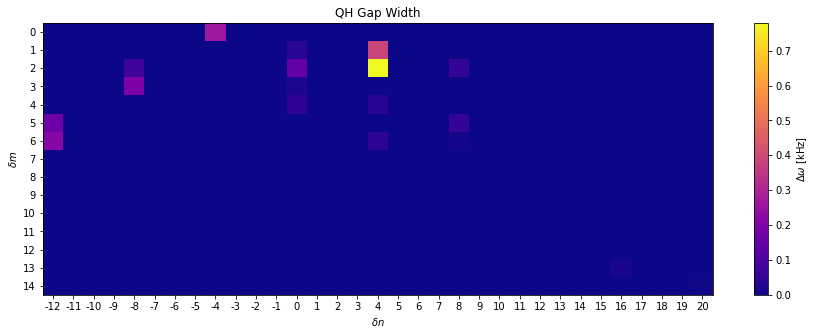

delta m, delta n       Average Width [kHz]         Average Freq [kHz]  
6,8                    0.007298207584262587        0.23388149665530705 
5,-12                  0.1667702303533689          3.0633981961443757  
2,-8                   0.07912288539942125         3.0404682554307865  
14,20                  0.0043719283429615174       1.4030146720961971  
1,4                    0.3864239405897265          2.5869402479711194  
6,4                    0.04491230733372653         1.9358935400932373  
4,4                    0.03449837890152463         0.296225243248824   
2,0                    0.14698952037320173         1.4899579434469565  
0,-4                   0.2610299519789008          2.1575639263295403  
3,0                    0.01889214238139969         2.1039013547347993  
2,8                    0.05548375333898381         3.040108645114129   
6,-12                  0.2151115206213614          2.4935997012122035  
3,-8                   0.19241276794646134         2.47296375164

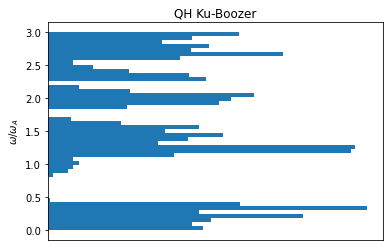

In [4]:
# import stellgap

# stellgap_output = stellgap.AlfvenSpecData.from_dir(".")
stellgap_output = AlfvenSpecData.from_dir(".")
# stellgap.plot_continuum(stellgap_output.get_modes())
# plot_continuum_normalized(stellgap_output.get_modes())
fig = plot_continuum_normalized(stellgap_output.get_modes(), ylims=[0,3], show_legend=True) # , show_legend=True
# fig = plot_continuum_normalized(stellgap_output.get_modes(), show_legend=True) # , show_legend=True
# fig.write_image("fig1.svg")

# TODO: Note that the frequency of the particular gap can vary quite a bit, so taking the average to find \overline{omega_0} is probably not the best idea

fig.show()